In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
import torch
import torch.nn as nn
from glob import glob
from os.path import expanduser, join, basename, dirname
import xarray as xr
import numpy as np
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
from joblib import Parallel, delayed
from itertools import product
from torch.utils.data import TensorDataset, DataLoader
from astra.torch.models import ResNetClassifier,ResNet18_Weights
from astra.torch.utils import train_fn

import torchvision.models as models
from astra.torch.metrics import accuracy_score, f1_score, precision_score, recall_score,classification_report

In [2]:
# Load the saved tensors
loaded_data1 = torch.load("/home/rishabh.mondal/Brick-Kilns-project/albk_rishabh/tensor_data/data.pt")

# Access the tensors
index = loaded_data1['index']
images = loaded_data1['images']
labels = loaded_data1['labels']
#print shape of tensors
images = images / 255
    # mean normalize
images = (images - images.mean(dim=(0, 2, 3), keepdim=True)) / images.std(dim=(0, 2, 3), keepdim=True)
print(images.shape)
print(labels.shape)
#print the labels
print(labels)
#count the number of unique labels
# count the number of 1s and 0s
unique, counts = np.unique(labels, return_counts=True)
print(dict(zip(unique, counts)))

# subset_labels = labels[:17000]   
# num_ones = np.count_nonzero(subset_labels == 1)
# num_zeros = np.count_nonzero(subset_labels == 0)

# print(f"Number of 1s(train ): {num_ones}")
# print(f"Number of 0s(train): {num_zeros}")

torch.Size([25500, 3, 224, 224])
torch.Size([25500])
tensor([0, 0, 0,  ..., 1, 0, 0], dtype=torch.uint8)
{0: 23803, 1: 1697}


In [3]:
# Load the saved tensors
loaded_data1 = torch.load("/home/rishabh.mondal/Brick-Kilns-project/albk_rishabh/tensor_data/data.pt")

# Access the tensors
index = loaded_data1['index']
images = loaded_data1['images']
labels = loaded_data1['labels']
#print shape of tensors
images = images / 255
    # mean normalize
images = (images - images.mean(dim=(0, 2, 3), keepdim=True)) / images.std(dim=(0, 2, 3), keepdim=True)
print(images.shape)
print(labels.shape)
#print the labels
print(labels)
#count the number of unique labels
# count the number of 1s and 0s
unique, counts = np.unique(labels, return_counts=True)
print(dict(zip(unique, counts)))

# subset_labels = labels[:17000]   
# num_ones = np.count_nonzero(subset_labels == 1)
# num_zeros = np.count_nonzero(subset_labels == 0)

# print(f"Number of 1s(train ): {num_ones}")
# print(f"Number of 0s(train): {num_zeros}")

torch.Size([25500, 3, 224, 224])
torch.Size([25500])
tensor([0, 0, 0,  ..., 1, 0, 0], dtype=torch.uint8)
{0: 23803, 1: 1697}


In [4]:
train_dataset = TensorDataset(images, labels)
train_loader = DataLoader(train_dataset, batch_size=254, shuffle=True)


In [5]:
# Load the saved tensors
loaded_data = torch.load("/home/rishabh.mondal/Brick-Kilns-project/albk_rishabh/tensor_data/test_data.pt")

# Access the tensors
index1 = loaded_data['index']
images1 = loaded_data['images']
labels1 = loaded_data['labels']
#print shape of tensors
images1 = images1 / 255
    # mean normalize
images1 = (images1 - images1.mean(dim=(0, 2, 3), keepdim=True)) / images1.std(dim=(0, 2, 3), keepdim=True)
print(images1.shape)
print(labels1.shape)
#print the labels
print(labels1)
#count the number of unique labels
# count the number of 1s and 0s
unique, counts = np.unique(labels1, return_counts=True)
print(dict(zip(unique, counts)))

subset_labels = labels1  
num_ones = np.count_nonzero(subset_labels == 1)
num_zeros = np.count_nonzero(subset_labels == 0)

print(f"Number of 1s(train ): {num_ones}")
print(f"Number of 0s(train): {num_zeros}")

torch.Size([10025, 3, 224, 224])
torch.Size([10025])
tensor([0, 0, 0,  ..., 0, 0, 0], dtype=torch.uint8)
{0: 8983, 1: 1042}
Number of 1s(train ): 1042
Number of 0s(train): 8983


cuda


/home/jaiswalsuraj/miniconda3/envs/torch_gpu/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Loss: 0.00000006: 100%|██████████| 100/100 [34:17<00:00, 20.58s/it]


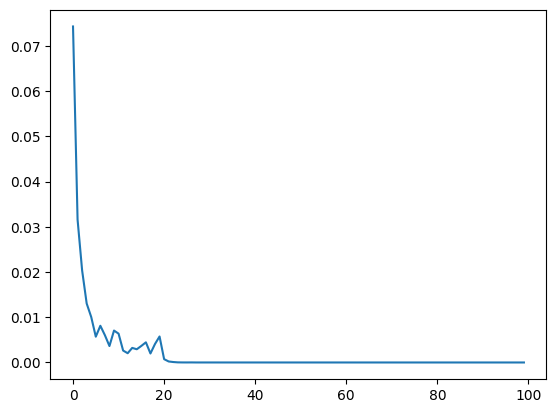

In [6]:

test_dataset = TensorDataset(images1, labels1)
test_loader = DataLoader(test_dataset, batch_size=254, shuffle=False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
train_model = ResNetClassifier(
    models.resnet18,ResNet18_Weights, n_classes=2, activation=nn.ReLU(), dropout=0.1
).to(device)

iter_losses, epoch_losses = train_fn(
    train_model,
    nn.CrossEntropyLoss(),
    dataloader=train_loader,
    lr=3e-4,
    epochs=100,
    verbose=True,
    wandb_log=False,
)
plt.plot(epoch_losses)


In [7]:
with torch.no_grad():
    pred_classes =train_model.predict_class(
        dataloader=test_loader, batch_size=254, verbose=True
    ).to(device)

test_labels = labels1.to(device)
print("Accuracy: ", accuracy_score(pred_classes,test_labels))
print("Precision: ", precision_score(pred_classes,test_labels))
print("Recall: ", recall_score(pred_classes,test_labels))
print("F1: ", f1_score(pred_classes,test_labels))
print("classification report: ", classification_report(pred_classes,test_labels))


100%|██████████| 40/40 [00:03<00:00, 12.82it/s]


Accuracy:  tensor(0.9343, device='cuda:0')
Precision:  tensor(0.9549, device='cuda:0')
Recall:  tensor(0.3858, device='cuda:0')
F1:  tensor(0.5496, device='cuda:0')
classification report:  {'accuracy': tensor(0.9343, device='cuda:0'), 'precision': tensor(0.9549, device='cuda:0'), 'recall': tensor(0.3858, device='cuda:0'), 'f1': tensor(0.5496, device='cuda:0')}


In [8]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
print("Classification Report:\n", classification_report(test_labels.cpu().numpy(), pred_classes.cpu().numpy()))

Classification Report:
               precision    recall  f1-score   support

           0       0.93      1.00      0.96      8983
           1       0.95      0.39      0.55      1042

    accuracy                           0.93     10025
   macro avg       0.94      0.69      0.76     10025
weighted avg       0.94      0.93      0.92     10025



In [46]:
#print the index of the images which are misclassified
misclassified_idx = np.where(pred_classes.cpu() != test_labels.cpu())[0]
misclassified_idx = misclassified_idx[400:600]
print(misclassified_idx)
# print(misclassified_idx)

[    0     1     2 ... 10022 10023 10024]


In [59]:
# Assuming pred_classes and labels1 are defined

# Find the indices of predicted positive images
predicted_positive_indices = np.where(pred_classes.cpu() == 1)[0]

# Find the indices of true positive images
misclassified_idx = np.where((pred_classes.cpu() == 1) & (labels1.cpu() == 1))[0]
# misclassified_idx = misclassified_idx[200:600]

# print("Indices of predicted positive images:", predicted_positive_indices)
print("Indices of true positive images:", misclassified_idx)
# print("Indices of true positive images:", true_positive_indices)


Indices of true positive images: [   13    21    24    27    44    54    66    97   119   139   151   154
   190   235   240   285   290   299   306   328   346   375   447   455
   490   521   583   587   592   596   611   621   716   725   745   758
   778   783   784   888   893   945   981   990   994  1010  1013  1017
  1018  1019  1024  1079  1113  1114  1130  1138  1175  1185  1196  1239
  1242  1244  1264  1317  1324  1479  1527  1700  1817  1846  1983  1985
  2041  2042  2116  2121  2171  2197  2238  2242  2352  2374  2383  2408
  2413  2421  2422  2553  2566  2614  2615  2618  2646  2673  2683  2702
  2725  2814  2821  2823  2840  2851  2874  2924  2936  2987  3027  3030
  3152  3229  3242  3258  3259  3325  3337  3341  3343  3417  3431  3438
  3458  3476  3477  3509  3520  3532  3571  3654  3669  3674  3700  3706
  3707  3712  3718  3721  3723  3724  3811  3833  3871  3893  3928  3935
  4053  4114  4190  4195  4215  4216  4227  4279  4285  4288  4313  4351
  4382  4454  4463

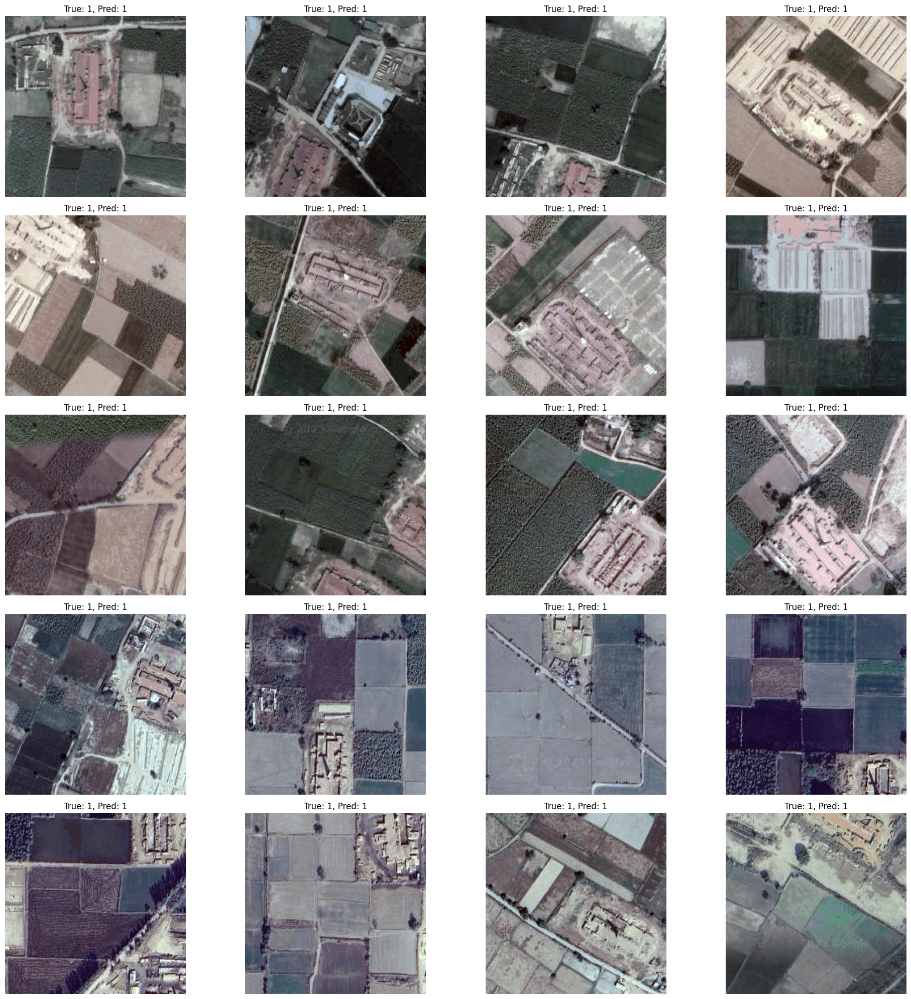

In [60]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

# Assuming misclassified_idx, images1, labels1, pred_classes are defined

# Plot the misclassified images in a 5x4 grid
fig, axes = plt.subplots(5, 4, figsize=(20, 20))

for i in range(5):
    for j in range(4):
        idx = i * 4 + j
        if idx < len(misclassified_idx):
            image = images1[misclassified_idx[idx]].permute(1, 2, 0)
            image = (image - image.min()) / (image.max() - image.min())

            label = labels1[misclassified_idx[idx]].item()
            predicted_label = pred_classes[misclassified_idx[idx]].item()

            # Create AxesImage from the image array
            img_obj = axes[i, j].imshow(image)

            axes[i, j].set_title(f"True: {label}, Pred: {predicted_label}")
            axes[i, j].axis('off')
        else:
            # If there are fewer than 20 misclassified images, leave the remaining subplots blank
            axes[i, j].axis('off')


# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()


/tmp/ipykernel_1943159/4209572981.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


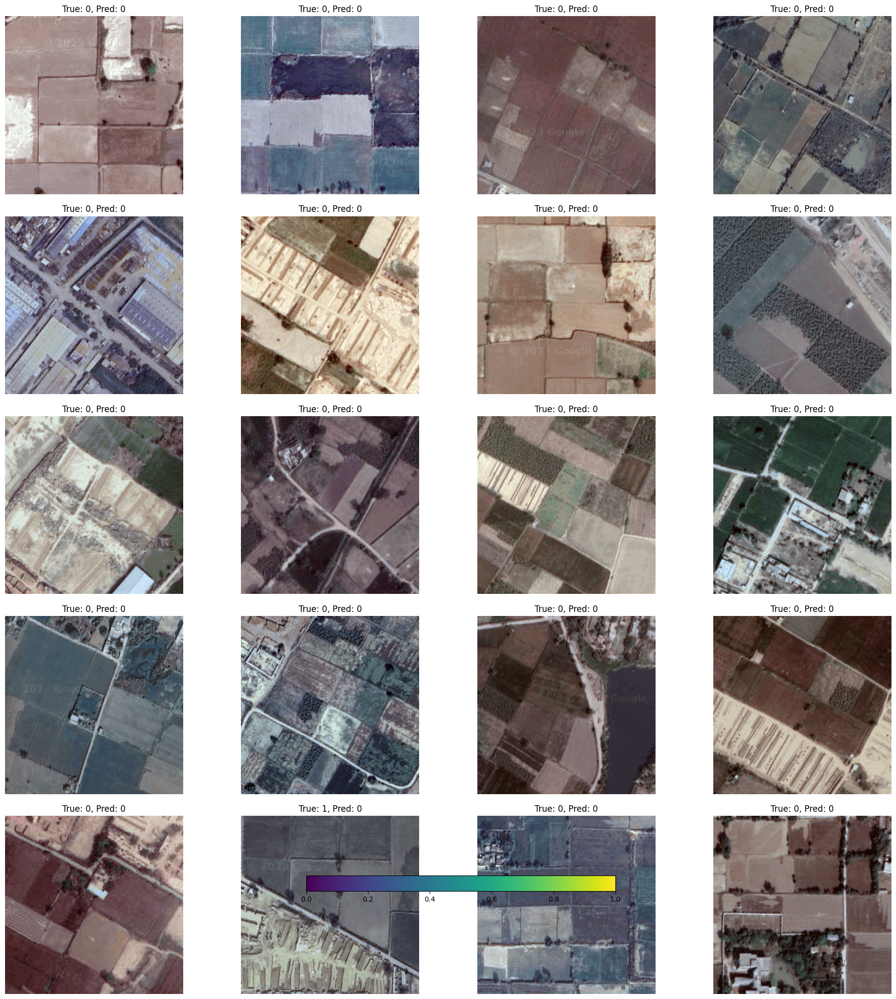

In [37]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming images1, labels1, pred_classes are defined

# Generate 5 random rows and 4 random columns for subplots
random_rows = np.random.randint(0, len(images1), size=(5, 4))

# Plot the random images in a 5x4 grid
fig, axes = plt.subplots(5, 4, figsize=(20, 20))

for i in range(5):
    for j in range(4):
        idx = random_rows[i, j]
        image = images1[idx].permute(1, 2, 0)
        image = (image - image.min()) / (image.max() - image.min())

        label = labels1[idx].item()
        predicted_label = pred_classes[idx].item()

        # Create AxesImage from the image array
        img_obj = axes[i, j].imshow(image)

        axes[i, j].set_title(f"True: {label}, Pred: {predicted_label}")
        axes[i, j].axis('off')

# Create a common colorbar for all subplots
cbar = fig.colorbar(img_obj, ax=axes, orientation='horizontal', fraction=0.02, pad=0.1)

# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()


In [64]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Assuming test_labels and pred_classes are defined

# Compute the confusion matrix
cm = confusion_matrix(test_labels.cpu().numpy(), pred_classes.cpu().numpy())

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


ModuleNotFoundError: No module named 'seaborn'